# Distribution Analysis: ProGAN Real vs Fake

분석 내용:
1. **|∇I| 히스토그램**: Gradient magnitude 분포
2. **방향별 엣지 빈도**: Gradient direction 히스토그램
3. **패치별 텍스처 통계**: 패치 단위 mean/std/entropy 분포

비교 대상:
- ProGAN Real vs Fake (각 1장)
- Original / Gaussian / JPEG 버전

In [1]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import imagecorruptions
from scipy import ndimage
from skimage.filters import sobel_h, sobel_v
from skimage.measure import shannon_entropy

%matplotlib inline
plt.rcParams['figure.dpi'] = 100

## 1. 데이터 로드

In [2]:
# 경로 설정
dataset_root = Path("/workspace/robust_deepfake_ai/dataset/test/progan/car")

# Real/Fake 이미지 1개씩 로드
real_images = sorted(list((dataset_root / "0_real").glob("*.png")))
fake_images = sorted(list((dataset_root / "1_fake").glob("*.png")))

real_path = real_images[5]
fake_path = fake_images[5]

print(f"Real: {real_path.name}")
print(f"Fake: {fake_path.name}")

Real: 00335.png
Fake: 00335.png


In [3]:
def load_image(image_path, resize=256):
    """Load and preprocess image"""
    img = Image.open(image_path).convert('RGB')
    img = img.resize((resize, resize), Image.BILINEAR)
    img_np = np.array(img).astype(np.float32) / 255.0
    return img_np

def apply_corruption(img_np, corruption_type, severity=3):
    """Apply corruption"""
    img_uint8 = (img_np * 255).astype(np.uint8)
    corrupted = imagecorruptions.corrupt(img_uint8, corruption_name=corruption_type, severity=severity)
    return corrupted.astype(np.float32) / 255.0

# Load images
real_img = load_image(real_path)
fake_img = load_image(fake_path)

# Apply corruptions
real_gaussian = apply_corruption(real_img, 'gaussian_noise', 3)
real_jpeg = apply_corruption(real_img, 'jpeg_compression', 3)

fake_gaussian = apply_corruption(fake_img, 'gaussian_noise', 3)
fake_jpeg = apply_corruption(fake_img, 'jpeg_compression', 3)

print("✓ Images loaded and corrupted")

✓ Images loaded and corrupted


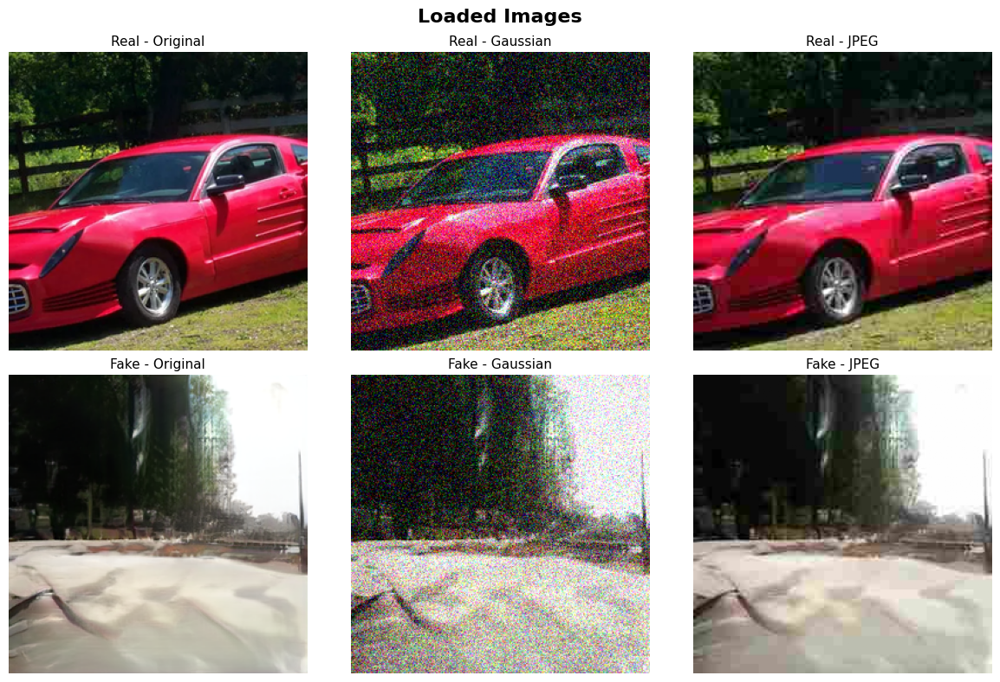

In [4]:
# Visualize loaded images
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle('Loaded Images', fontsize=16, fontweight='bold')

images = [
    (real_img, 'Real - Original'),
    (real_gaussian, 'Real - Gaussian'),
    (real_jpeg, 'Real - JPEG'),
    (fake_img, 'Fake - Original'),
    (fake_gaussian, 'Fake - Gaussian'),
    (fake_jpeg, 'Fake - JPEG'),
]

for idx, (img, title) in enumerate(images):
    ax = axes[idx // 3, idx % 3]
    ax.imshow(img)
    ax.set_title(title, fontsize=11)
    ax.axis('off')

plt.tight_layout()
plt.show()

## 2. Gradient 계산 함수

In [5]:
def compute_gradients(img):
    """
    Compute gradient magnitude and direction
    
    Args:
        img: (H, W, 3) RGB image in [0, 1]
    
    Returns:
        magnitude: (H, W) gradient magnitude
        direction: (H, W) gradient direction in radians [-π, π]
    """
    # Convert to grayscale
    gray = np.dot(img[..., :3], [0.299, 0.587, 0.114])
    
    # Sobel gradients
    gx = sobel_h(gray)
    gy = sobel_v(gray)
    
    # Magnitude and direction
    magnitude = np.sqrt(gx**2 + gy**2)
    direction = np.arctan2(gy, gx)  # [-π, π]
    
    return magnitude, direction, gx, gy

def compute_edge_direction_histogram(direction, magnitude, threshold=0.01, n_bins=8):
    """
    Compute edge direction histogram
    
    Args:
        direction: (H, W) gradient direction in radians
        magnitude: (H, W) gradient magnitude
        threshold: minimum magnitude to consider as edge
        n_bins: number of direction bins (4 or 8)
    
    Returns:
        hist: (n_bins,) histogram of edge directions
        bin_edges: (n_bins+1,) bin edges in degrees
    """
    # Filter by magnitude threshold
    mask = magnitude > threshold
    directions_filtered = direction[mask]
    
    # Convert to degrees [0, 360)
    directions_deg = np.degrees(directions_filtered) % 360
    
    # Histogram
    bin_edges = np.linspace(0, 360, n_bins + 1)
    hist, _ = np.histogram(directions_deg, bins=bin_edges)
    
    return hist, bin_edges

def compute_patch_statistics(img, patch_size=16):
    """
    Compute patch-wise texture statistics
    
    Args:
        img: (H, W, 3) RGB image
        patch_size: size of each patch
    
    Returns:
        stats: dict with 'mean', 'std', 'entropy' arrays
    """
    H, W, C = img.shape
    n_patches_h = H // patch_size
    n_patches_w = W // patch_size
    
    # Convert to grayscale for entropy
    gray = np.dot(img[..., :3], [0.299, 0.587, 0.114])
    
    means = []
    stds = []
    entropies = []
    
    for i in range(n_patches_h):
        for j in range(n_patches_w):
            # Extract patch
            patch = gray[i*patch_size:(i+1)*patch_size, 
                        j*patch_size:(j+1)*patch_size]
            
            # Compute statistics
            means.append(patch.mean())
            stds.append(patch.std())
            
            # Entropy (8-bit quantization)
            patch_uint8 = (patch * 255).astype(np.uint8)
            entropy = shannon_entropy(patch_uint8)
            entropies.append(entropy)
    
    return {
        'mean': np.array(means),
        'std': np.array(stds),
        'entropy': np.array(entropies),
        'n_patches_h': n_patches_h,
        'n_patches_w': n_patches_w,
    }

print("✓ Gradient functions defined")

✓ Gradient functions defined


## 3. Gradient 분석 실행

In [6]:
# Compute gradients for all images
results = {}

image_dict = {
    'Real - Original': real_img,
    'Real - Gaussian': real_gaussian,
    'Real - JPEG': real_jpeg,
    'Fake - Original': fake_img,
    'Fake - Gaussian': fake_gaussian,
    'Fake - JPEG': fake_jpeg,
}

for name, img in image_dict.items():
    print(f"Processing: {name}")
    
    # Gradients
    magnitude, direction, gx, gy = compute_gradients(img)
    
    # Edge direction histogram
    edge_hist, edge_bins = compute_edge_direction_histogram(direction, magnitude, n_bins=8)
    
    # Patch statistics
    patch_stats = compute_patch_statistics(img, patch_size=16)
    
    results[name] = {
        'magnitude': magnitude,
        'direction': direction,
        'gx': gx,
        'gy': gy,
        'edge_hist': edge_hist,
        'edge_bins': edge_bins,
        'patch_stats': patch_stats,
    }

print("\n✓ Gradient analysis complete")

Processing: Real - Original
Processing: Real - Gaussian


Processing: Real - JPEG
Processing: Fake - Original
Processing: Fake - Gaussian
Processing: Fake - JPEG

✓ Gradient analysis complete


## 4. 시각화 1: Gradient Magnitude 히스토그램

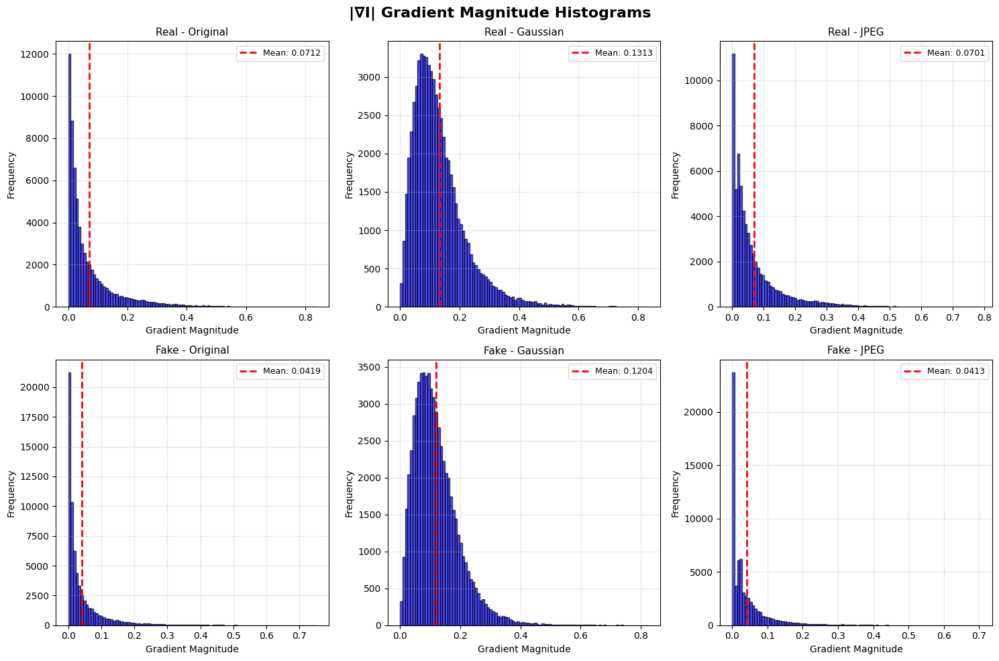

✓ Saved: analysis_gradient_magnitude.png


In [7]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('|∇I| Gradient Magnitude Histograms', fontsize=16, fontweight='bold')

for idx, (name, data) in enumerate(results.items()):
    ax = axes[idx // 3, idx % 3]
    
    magnitude = data['magnitude']
    
    # Histogram
    ax.hist(magnitude.flatten(), bins=100, alpha=0.7, color='blue', edgecolor='black')
    ax.set_xlabel('Gradient Magnitude', fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.set_title(name, fontsize=11)
    ax.grid(True, alpha=0.3)
    
    # Statistics
    mean_val = magnitude.mean()
    std_val = magnitude.std()
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.4f}')
    ax.legend(fontsize=9)

plt.tight_layout()
plt.savefig('/workspace/robust_deepfake_ai/analysis_gradient_magnitude.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved: analysis_gradient_magnitude.png")

## 5. 시각화 2: 방향별 엣지 빈도 (Polar Plot)

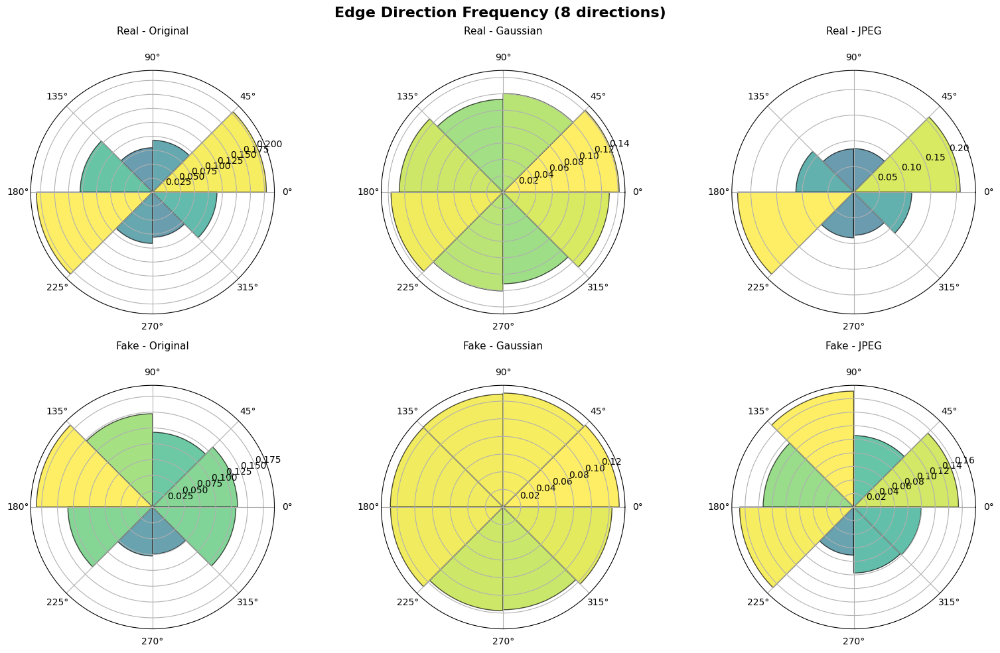

✓ Saved: analysis_edge_direction.png


In [8]:
fig = plt.figure(figsize=(16, 10))
fig.suptitle('Edge Direction Frequency (8 directions)', fontsize=16, fontweight='bold')

for idx, (name, data) in enumerate(results.items(), 1):
    ax = fig.add_subplot(2, 3, idx, projection='polar')
    
    edge_hist = data['edge_hist']
    edge_bins = data['edge_bins']
    
    # Bin centers in radians
    bin_centers = (edge_bins[:-1] + edge_bins[1:]) / 2
    bin_centers_rad = np.radians(bin_centers)
    
    # Normalize
    edge_hist_norm = edge_hist / edge_hist.sum()
    
    # Polar bar plot
    width = np.radians(360 / len(edge_hist))
    bars = ax.bar(bin_centers_rad, edge_hist_norm, width=width, alpha=0.7, edgecolor='black')
    
    # Color bars
    for bar, height in zip(bars, edge_hist_norm):
        bar.set_facecolor(plt.cm.viridis(height / edge_hist_norm.max()))
    
    ax.set_title(name, fontsize=11, pad=20)
    ax.set_theta_zero_location('E')
    ax.set_theta_direction(1)

plt.tight_layout()
plt.savefig('/workspace/robust_deepfake_ai/analysis_edge_direction.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved: analysis_edge_direction.png")

## 6. 시각화 3: 패치별 텍스처 통계

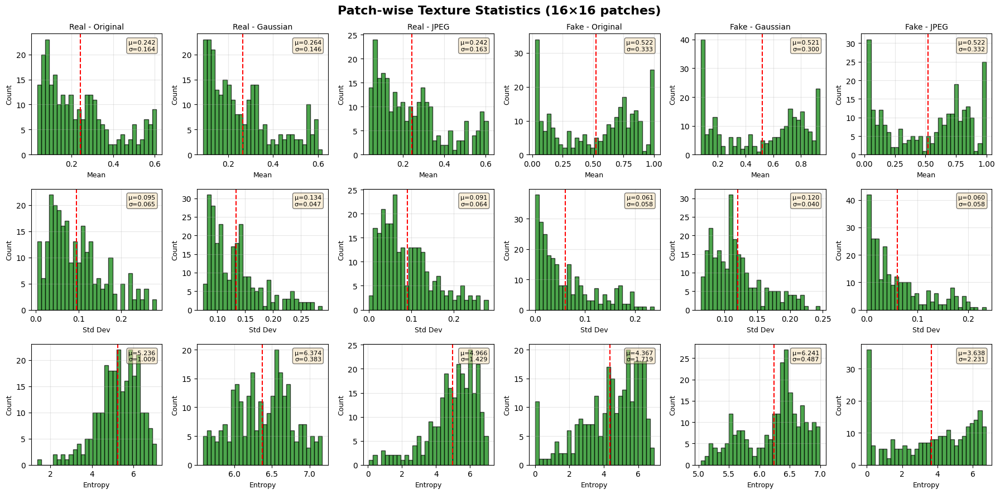

✓ Saved: analysis_patch_statistics.png


In [9]:
fig, axes = plt.subplots(3, 6, figsize=(18, 9))
fig.suptitle('Patch-wise Texture Statistics (16×16 patches)', fontsize=16, fontweight='bold')

stat_names = ['mean', 'std', 'entropy']
stat_labels = ['Mean', 'Std Dev', 'Entropy']

for stat_idx, (stat_name, stat_label) in enumerate(zip(stat_names, stat_labels)):
    for img_idx, (name, data) in enumerate(results.items()):
        ax = axes[stat_idx, img_idx]
        
        patch_stats = data['patch_stats']
        stat_values = patch_stats[stat_name]
        
        # Histogram
        ax.hist(stat_values, bins=30, alpha=0.7, color='green', edgecolor='black')
        ax.set_xlabel(stat_label, fontsize=9)
        ax.set_ylabel('Count', fontsize=9)
        
        if stat_idx == 0:
            ax.set_title(name, fontsize=10)
        
        # Statistics
        mean_val = stat_values.mean()
        std_val = stat_values.std()
        ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.5)
        ax.text(0.95, 0.95, f'μ={mean_val:.3f}\nσ={std_val:.3f}', 
                transform=ax.transAxes, fontsize=8, va='top', ha='right',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('/workspace/robust_deepfake_ai/analysis_patch_statistics.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved: analysis_patch_statistics.png")

## 7. 시각화 4: Gradient Magnitude 맵

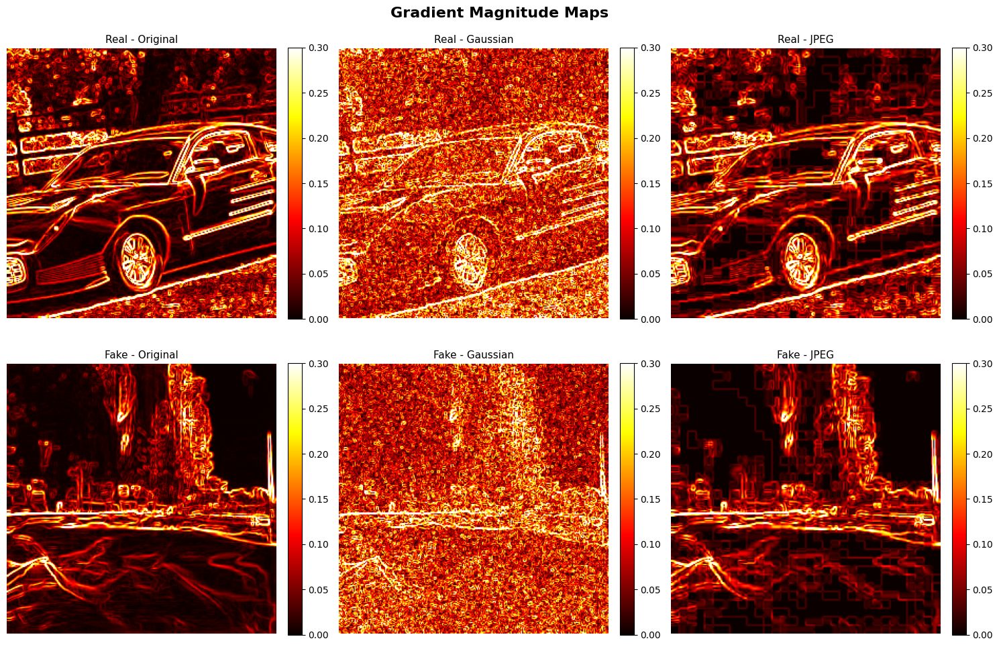

✓ Saved: analysis_gradient_maps.png


In [10]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Gradient Magnitude Maps', fontsize=16, fontweight='bold')

for idx, (name, data) in enumerate(results.items()):
    ax = axes[idx // 3, idx % 3]
    
    magnitude = data['magnitude']
    
    # Visualize magnitude map
    im = ax.imshow(magnitude, cmap='hot', vmin=0, vmax=0.3)
    ax.set_title(name, fontsize=11)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig('/workspace/robust_deepfake_ai/analysis_gradient_maps.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved: analysis_gradient_maps.png")

## 8. 통계 비교표

In [11]:
import pandas as pd

# Collect statistics
stats_data = []

for name, data in results.items():
    magnitude = data['magnitude']
    patch_stats = data['patch_stats']
    
    stats_data.append({
        'Image': name,
        'Grad Mean': magnitude.mean(),
        'Grad Std': magnitude.std(),
        'Grad Max': magnitude.max(),
        'Patch Mean μ': patch_stats['mean'].mean(),
        'Patch Std μ': patch_stats['std'].mean(),
        'Patch Entropy μ': patch_stats['entropy'].mean(),
    })

df = pd.DataFrame(stats_data)
df = df.round(4)

print("\n" + "="*80)
print("GRADIENT & TEXTURE STATISTICS COMPARISON")
print("="*80)
print(df.to_string(index=False))
print("="*80)


GRADIENT & TEXTURE STATISTICS COMPARISON
          Image  Grad Mean  Grad Std  Grad Max  Patch Mean μ  Patch Std μ  Patch Entropy μ
Real - Original     0.0712    0.0936    0.8370        0.2418       0.0951           5.2365
Real - Gaussian     0.1313    0.0907    0.8335        0.2642       0.1339           6.3738
    Real - JPEG     0.0701    0.0868    0.7865        0.2418       0.0914           4.9661
Fake - Original     0.0419    0.0671    0.7507        0.5223       0.0611           4.3666
Fake - Gaussian     0.1204    0.0770    0.8248        0.5207       0.1202           6.2410
    Fake - JPEG     0.0413    0.0647    0.7024        0.5223       0.0598           3.6379


## 9. Real vs Fake 비교 분석

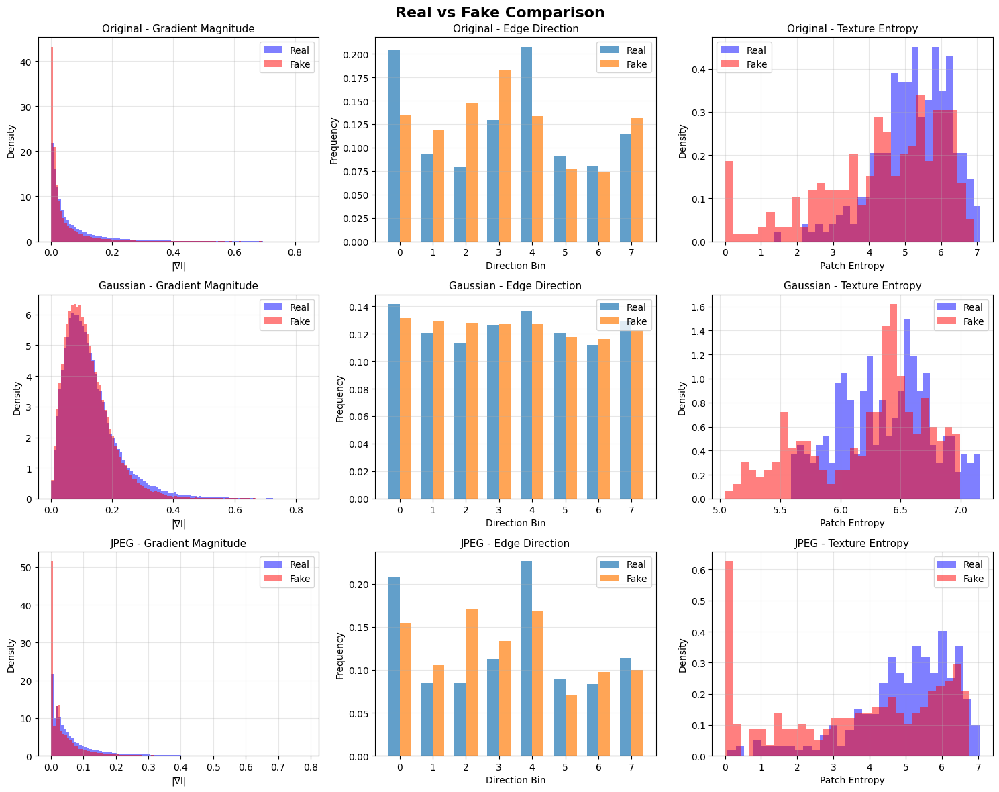

✓ Saved: analysis_real_vs_fake.png


In [12]:
# Compare Real vs Fake for each corruption type
corruption_types = ['Original', 'Gaussian', 'JPEG']

fig, axes = plt.subplots(len(corruption_types), 3, figsize=(15, 12))
fig.suptitle('Real vs Fake Comparison', fontsize=16, fontweight='bold')

for corr_idx, corruption in enumerate(corruption_types):
    real_name = f'Real - {corruption}'
    fake_name = f'Fake - {corruption}'
    
    real_data = results[real_name]
    fake_data = results[fake_name]
    
    # 1. Gradient magnitude histogram
    ax = axes[corr_idx, 0]
    ax.hist(real_data['magnitude'].flatten(), bins=100, alpha=0.5, color='blue', label='Real', density=True)
    ax.hist(fake_data['magnitude'].flatten(), bins=100, alpha=0.5, color='red', label='Fake', density=True)
    ax.set_xlabel('|∇I|', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{corruption} - Gradient Magnitude', fontsize=11)
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 2. Edge direction comparison (bar chart)
    ax = axes[corr_idx, 1]
    x = np.arange(len(real_data['edge_hist']))
    width = 0.35
    real_hist_norm = real_data['edge_hist'] / real_data['edge_hist'].sum()
    fake_hist_norm = fake_data['edge_hist'] / fake_data['edge_hist'].sum()
    ax.bar(x - width/2, real_hist_norm, width, label='Real', alpha=0.7)
    ax.bar(x + width/2, fake_hist_norm, width, label='Fake', alpha=0.7)
    ax.set_xlabel('Direction Bin', fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.set_title(f'{corruption} - Edge Direction', fontsize=11)
    ax.set_xticks(x)
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')
    
    # 3. Patch entropy comparison
    ax = axes[corr_idx, 2]
    real_entropy = real_data['patch_stats']['entropy']
    fake_entropy = fake_data['patch_stats']['entropy']
    ax.hist(real_entropy, bins=30, alpha=0.5, color='blue', label='Real', density=True)
    ax.hist(fake_entropy, bins=30, alpha=0.5, color='red', label='Fake', density=True)
    ax.set_xlabel('Patch Entropy', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{corruption} - Texture Entropy', fontsize=11)
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('/workspace/robust_deepfake_ai/analysis_real_vs_fake.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Saved: analysis_real_vs_fake.png")

## 10. 요약 및 결론

In [13]:
print("\n" + "="*80)
print("ANALYSIS SUMMARY")
print("="*80)

for corruption in corruption_types:
    real_name = f'Real - {corruption}'
    fake_name = f'Fake - {corruption}'
    
    real_mag = results[real_name]['magnitude']
    fake_mag = results[fake_name]['magnitude']
    
    real_entropy = results[real_name]['patch_stats']['entropy']
    fake_entropy = results[fake_name]['patch_stats']['entropy']
    
    print(f"\n{corruption}:")
    print(f"  Gradient Magnitude:")
    print(f"    Real: mean={real_mag.mean():.4f}, std={real_mag.std():.4f}")
    print(f"    Fake: mean={fake_mag.mean():.4f}, std={fake_mag.std():.4f}")
    print(f"    Difference: {abs(fake_mag.mean() - real_mag.mean()):.4f} ({abs(fake_mag.mean() - real_mag.mean())/real_mag.mean()*100:.1f}%)")
    
    print(f"  Patch Entropy:")
    print(f"    Real: mean={real_entropy.mean():.4f}, std={real_entropy.std():.4f}")
    print(f"    Fake: mean={fake_entropy.mean():.4f}, std={fake_entropy.std():.4f}")
    print(f"    Difference: {abs(fake_entropy.mean() - real_entropy.mean()):.4f} ({abs(fake_entropy.mean() - real_entropy.mean())/real_entropy.mean()*100:.1f}%)")

print("\n" + "="*80)
print("✓ Analysis complete! All visualizations saved.")
print("="*80)


ANALYSIS SUMMARY

Original:
  Gradient Magnitude:
    Real: mean=0.0712, std=0.0936
    Fake: mean=0.0419, std=0.0671
    Difference: 0.0293 (41.2%)
  Patch Entropy:
    Real: mean=5.2365, std=1.0094
    Fake: mean=4.3666, std=1.7185
    Difference: 0.8699 (16.6%)

Gaussian:
  Gradient Magnitude:
    Real: mean=0.1313, std=0.0907
    Fake: mean=0.1204, std=0.0770
    Difference: 0.0108 (8.3%)
  Patch Entropy:
    Real: mean=6.3738, std=0.3831
    Fake: mean=6.2410, std=0.4871
    Difference: 0.1329 (2.1%)

JPEG:
  Gradient Magnitude:
    Real: mean=0.0701, std=0.0868
    Fake: mean=0.0413, std=0.0647
    Difference: 0.0288 (41.1%)
  Patch Entropy:
    Real: mean=4.9661, std=1.4292
    Fake: mean=3.6379, std=2.2314
    Difference: 1.3281 (26.7%)

✓ Analysis complete! All visualizations saved.


## 11. Classifier Feature Maps 분석

LGrad Classifier (ResNet50)의 각 층에서 나오는 feature map 시각화

In [14]:
# LGrad 모델 로드
import sys
sys.path.append('/workspace/robust_deepfake_ai')

from model.LGrad.lgrad_model import LGrad

# LGrad 초기화 (weights 경로는 실제 경로로 수정 필요)
device = 'cuda' if torch.cuda.is_available() else 'cpu'

try:
    lgrad = LGrad(
        stylegan_weights="model/LGrad/weights/karras2019stylegan-bedrooms-256x256_discriminator.pth",
        classifier_weights="model/LGrad/weights/LGrad-Pretrained-Model/LGrad-4class-Trainon-Progan_car_cat_chair_horse.pth",
        device=device,
        resize=256
    )
    print(f"✓ LGrad loaded on {device}")
    
    # Classifier 구조 확인
    print("\nClassifier architecture:")
    print(lgrad.classifier)
    
except Exception as e:
    print(f"⚠️ Could not load LGrad weights: {e}")
    print("Using dummy model for demonstration...")
    lgrad = None

/workspace/robust_deepfake_ai/model/LGrad/lgrad_model.py:43: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(stylegan_weights, map_location="cpu"),
/workspace/robus

✓ LGrad loaded on cuda

Classifier architecture:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0)

In [15]:
if lgrad is not None:
    # Feature map 추출을 위한 hook 설정
    feature_maps = {}
    
    def get_activation(name):
        def hook(model, input, output):
            feature_maps[name] = output.detach()
        return hook
    
    # ResNet50의 주요 층에 hook 등록
    hooks = []
    layer_names = []
    
    # conv1
    if hasattr(lgrad.classifier, 'conv1'):
        hooks.append(lgrad.classifier.conv1.register_forward_hook(get_activation('conv1')))
        layer_names.append('conv1')
    
    # layer1, layer2, layer3, layer4
    for i in range(1, 5):
        layer_name = f'layer{i}'
        if hasattr(lgrad.classifier, layer_name):
            layer = getattr(lgrad.classifier, layer_name)
            hooks.append(layer.register_forward_hook(get_activation(layer_name)))
            layer_names.append(layer_name)
    
    print(f"✓ Registered hooks for layers: {layer_names}")

✓ Registered hooks for layers: ['conv1', 'layer1', 'layer2', 'layer3', 'layer4']


In [16]:
if lgrad is not None:
    # 6개 이미지 모두에서 feature map 추출
    lgrad.eval()
    
    # 이미지 variants 정의
    image_variants = {
        'Real - Original': real_img,
        'Real - Gaussian': real_gaussian,
        'Real - JPEG': real_jpeg,
        'Fake - Original': fake_img,
        'Fake - Gaussian': fake_gaussian,
        'Fake - JPEG': fake_jpeg,
    }
    
    # 모든 이미지에 대해 feature map 추출
    all_features = {}
    
    print("Extracting feature maps for all images...")
    for name, img_np in image_variants.items():
        print(f"  Processing: {name}")
        
        # Tensor로 변환
        img_tensor = torch.from_numpy(img_np).permute(2, 0, 1).unsqueeze(0).float().to(device)
        
        # Feature map 추출
        feature_maps.clear()
        with torch.no_grad():
            artifact = lgrad.img2grad(img_tensor)
            _ = lgrad.classify(artifact)
        
        # 저장
        all_features[name] = {k: v.cpu() for k, v in feature_maps.items()}
    
    # Feature map shapes 출력
    print("\nFeature map shapes (all same):")
    first_name = list(all_features.keys())[0]
    for layer_name in layer_names:
        shape = all_features[first_name][layer_name].shape
        print(f"  {layer_name}: {shape}")
    
    print(f"\n✓ Feature maps extracted for {len(all_features)} images")

Extracting feature maps for all images...
  Processing: Real - Original


/workspace/robust_deepfake_ai/.venv/lib/python3.12/site-packages/torch/autograd/graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


  Processing: Real - Gaussian
  Processing: Real - JPEG
  Processing: Fake - Original
  Processing: Fake - Gaussian
  Processing: Fake - JPEG

Feature map shapes (all same):
  conv1: torch.Size([1, 64, 128, 128])
  layer1: torch.Size([1, 256, 64, 64])
  layer2: torch.Size([1, 512, 32, 32])
  layer3: torch.Size([1, 1024, 16, 16])
  layer4: torch.Size([1, 2048, 8, 8])

✓ Feature maps extracted for 6 images


In [17]:
if lgrad is not None:
    # Feature map 시각화 함수
    def visualize_feature_maps(features, title, n_channels=8):
        """
        Visualize feature maps from multiple layers
        
        Args:
            features: dict of {layer_name: tensor (1, C, H, W)}
            title: plot title
            n_channels: number of channels to display per layer
        """
        n_layers = len(features)
        
        fig, axes = plt.subplots(n_layers, n_channels, figsize=(16, 2.5 * n_layers))
        if n_layers == 1:
            axes = axes.reshape(1, -1)
        
        fig.suptitle(f'{title} - Classifier Feature Maps', fontsize=16, fontweight='bold')
        
        for layer_idx, (layer_name, fmap) in enumerate(features.items()):
            # fmap: (1, C, H, W)
            fmap = fmap[0]  # Remove batch dimension: (C, H, W)
            C, H, W = fmap.shape
            
            # Select channels to display (evenly spaced)
            if C > n_channels:
                channel_indices = np.linspace(0, C-1, n_channels, dtype=int)
            else:
                channel_indices = range(C)
                n_channels = C
            
            for ch_idx, channel in enumerate(channel_indices):
                ax = axes[layer_idx, ch_idx]
                
                # Get channel feature map
                channel_map = fmap[channel].numpy()
                
                # Normalize for visualization
                vmin, vmax = channel_map.min(), channel_map.max()
                if vmax - vmin > 1e-6:
                    channel_map_norm = (channel_map - vmin) / (vmax - vmin)
                else:
                    channel_map_norm = channel_map
                
                # Display
                im = ax.imshow(channel_map_norm, cmap='viridis')
                ax.axis('off')
                
                # Title (layer name + channel index)
                if ch_idx == 0:
                    ax.set_title(f'{layer_name}\\nCh {channel}', fontsize=9)
                else:
                    ax.set_title(f'Ch {channel}', fontsize=9)
        
        plt.tight_layout()
        return fig
    
    print("✓ Visualization function defined")

✓ Visualization function defined


Visualizing feature maps for all 6 image variants...



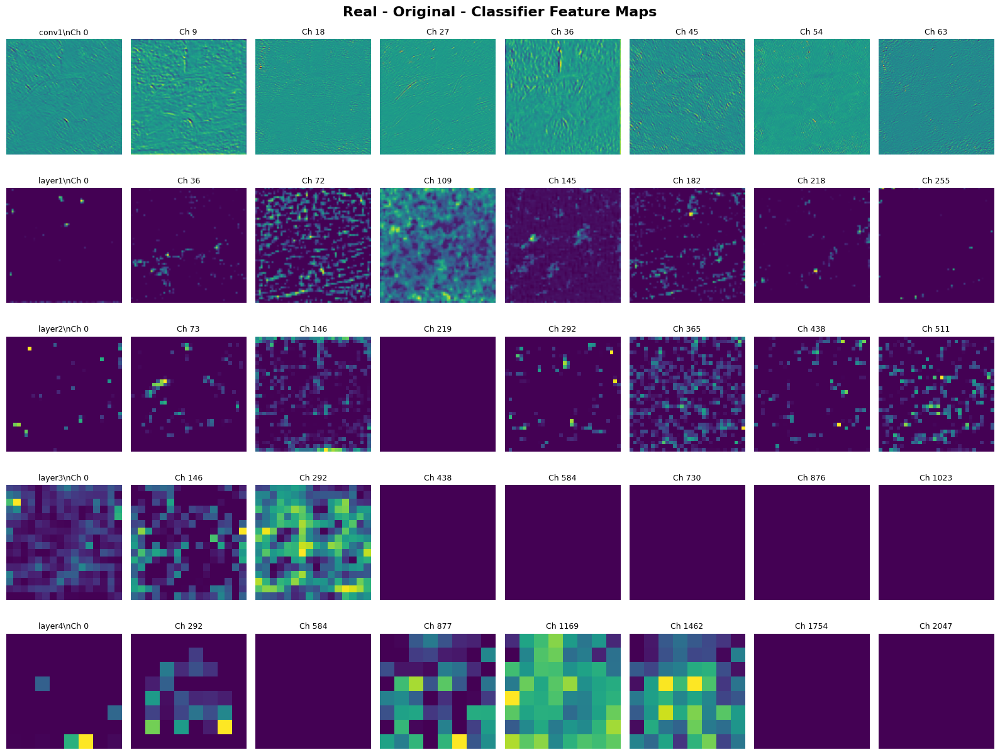

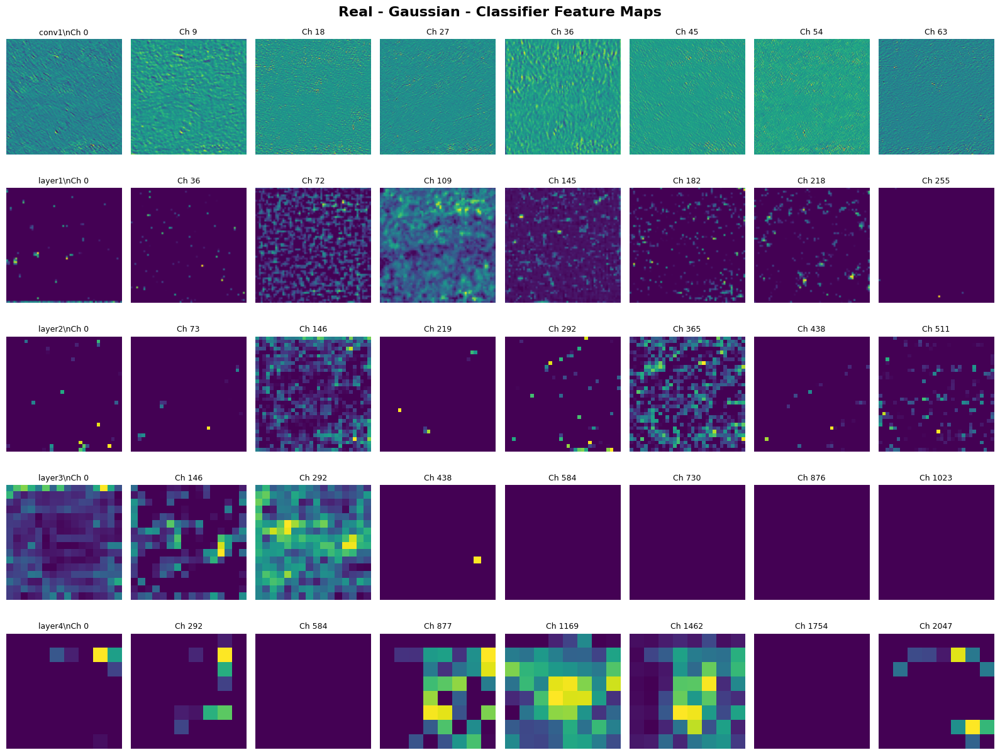

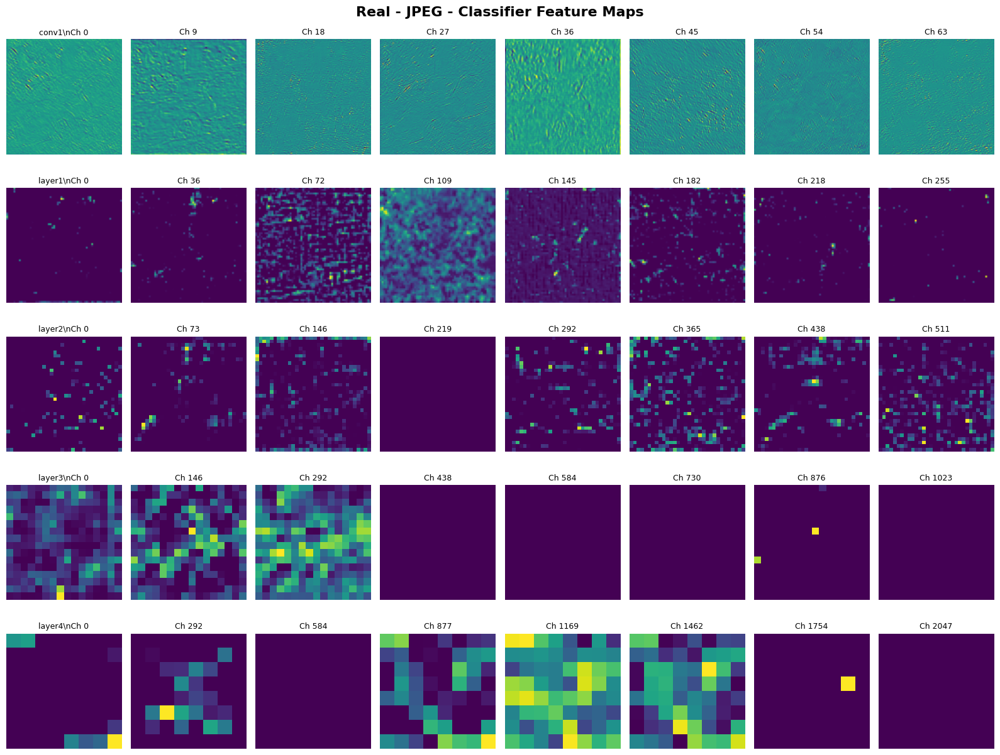

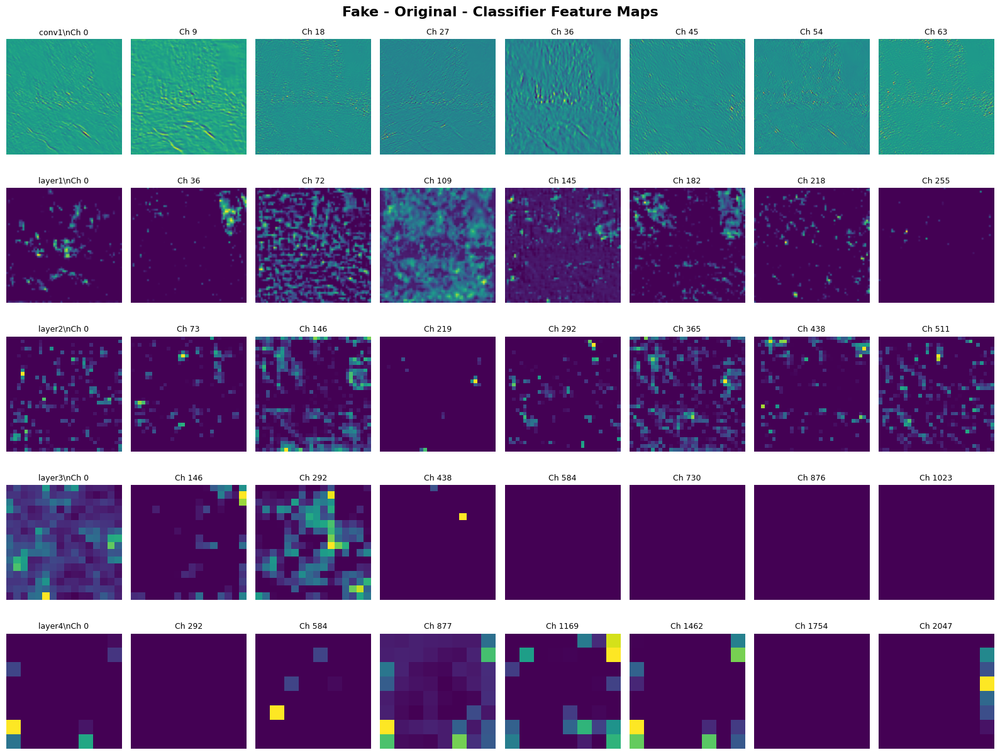

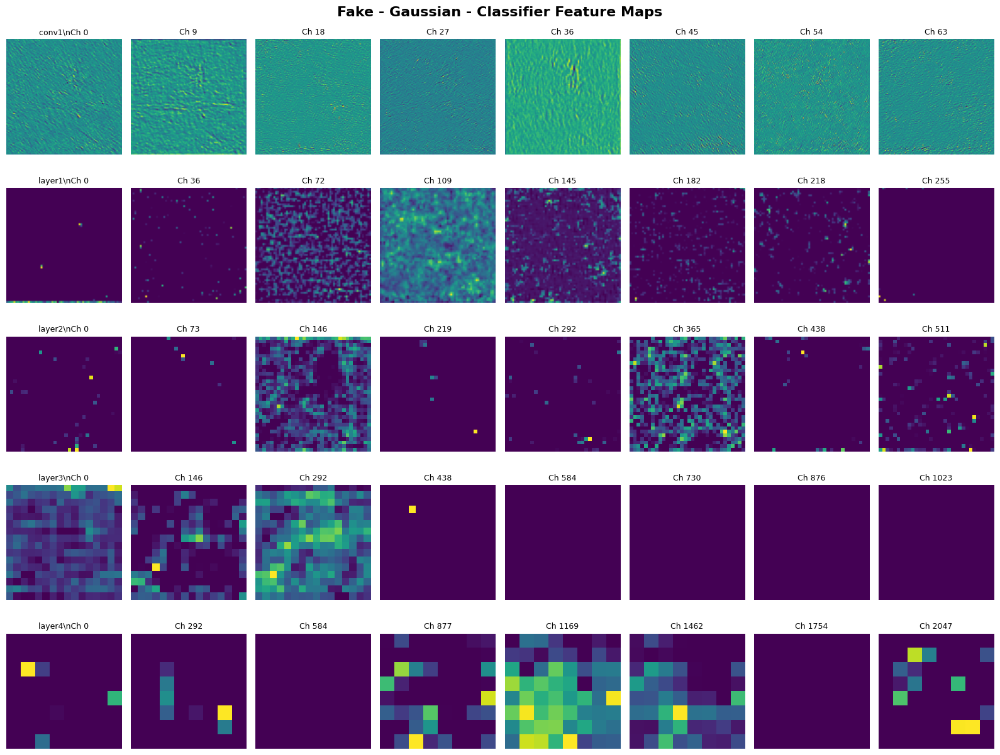

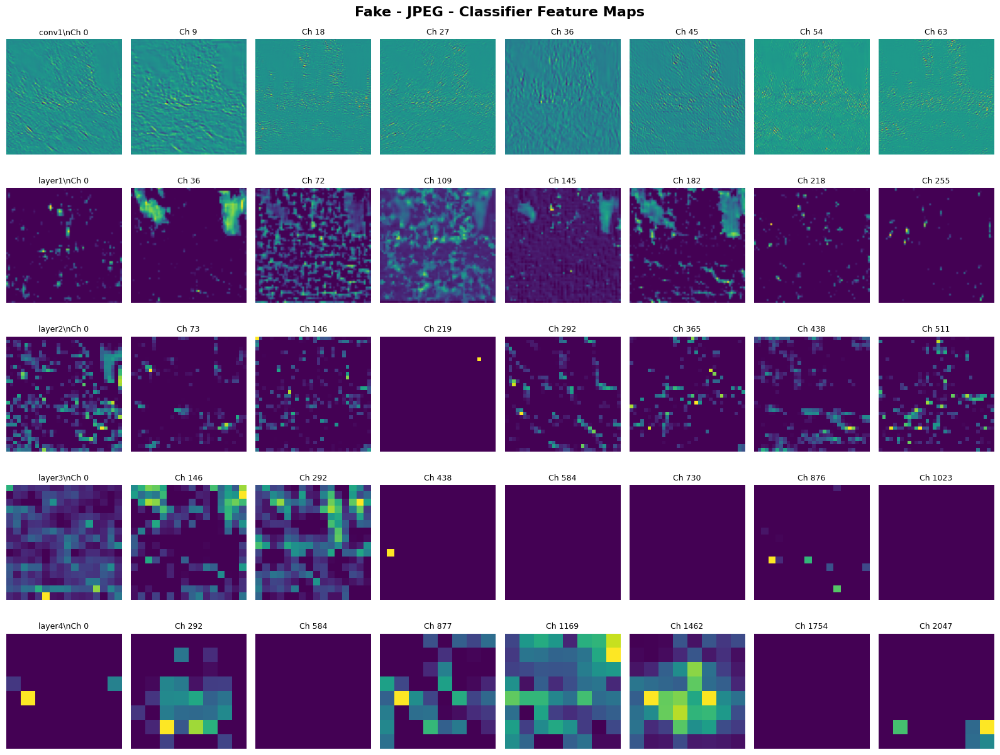


✓ All feature maps displayed!


In [18]:
if lgrad is not None:
    # 모든 이미지의 feature maps 시각화 (6개 이미지)
    print("Visualizing feature maps for all 6 image variants...\n")
    
    for img_name, features in all_features.items():
        fig = visualize_feature_maps(features, img_name, n_channels=8)
        plt.show()
    
    print("\n✓ All feature maps displayed!")

Computing feature map differences for each corruption type...



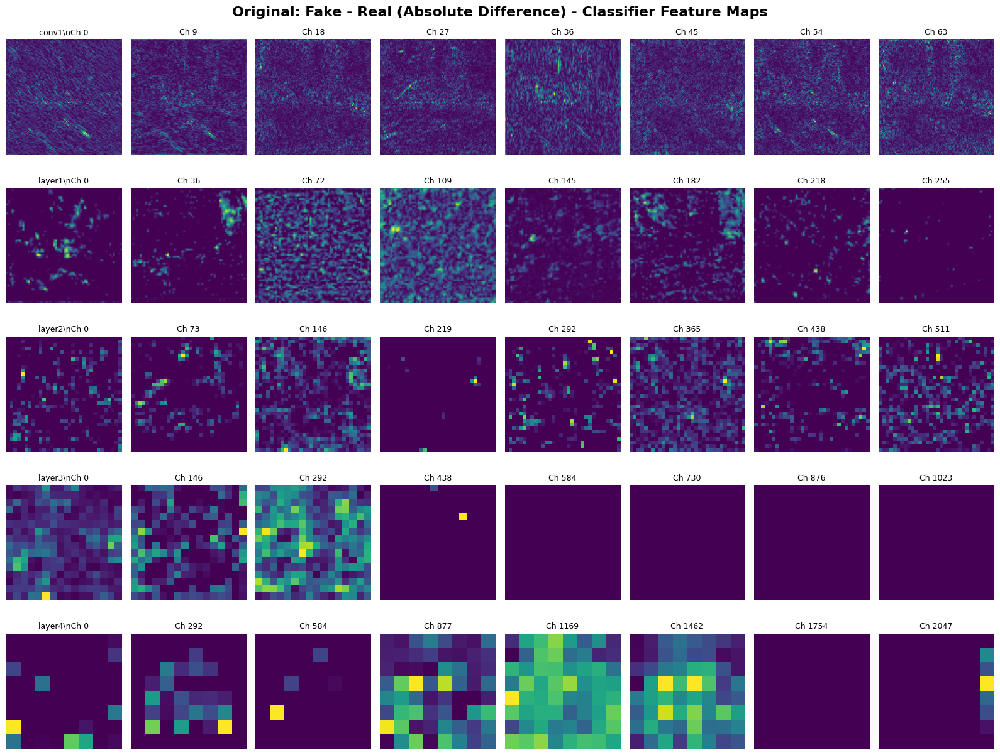

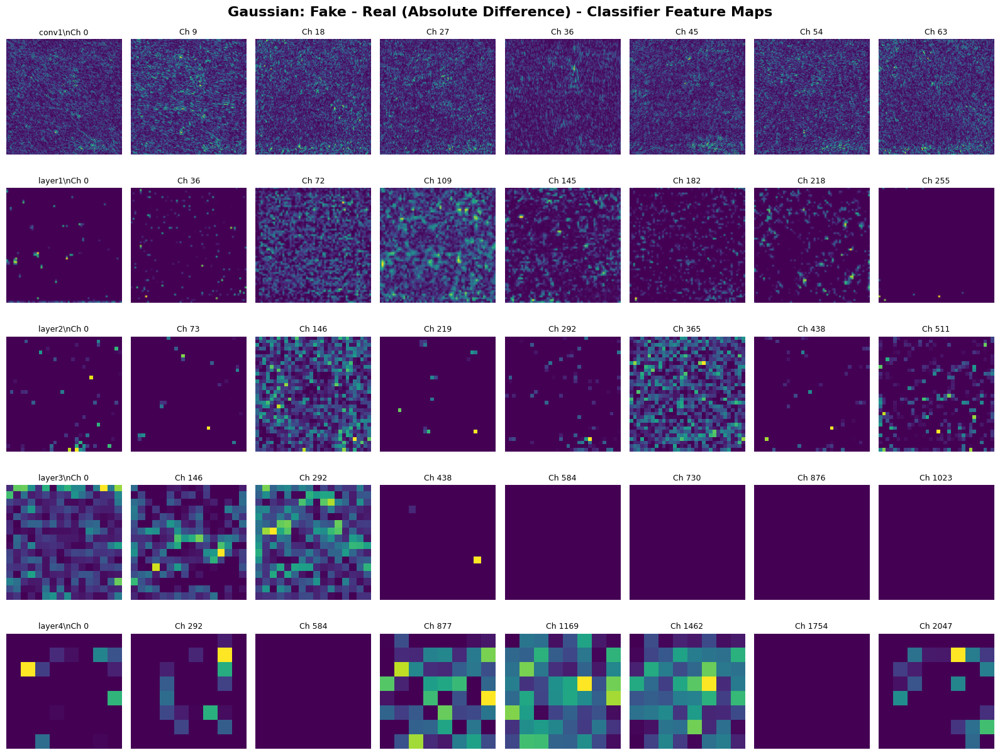

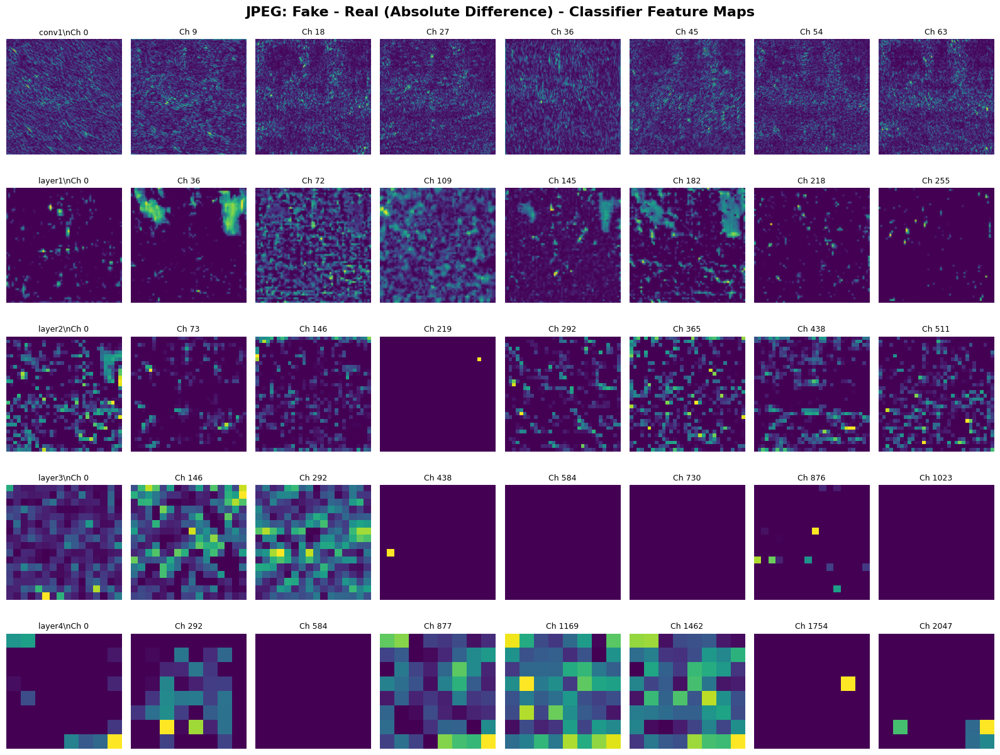


✓ All difference visualizations displayed!


In [19]:
if lgrad is not None:
    # Real vs Fake 비교: 각 corruption 타입별로 feature map 차이 시각화
    print("Computing feature map differences for each corruption type...\n")
    
    corruption_types = ['Original', 'Gaussian', 'JPEG']
    
    for corruption in corruption_types:
        real_name = f'Real - {corruption}'
        fake_name = f'Fake - {corruption}'
        
        # 차이 계산
        diff_features = {}
        for layer_name in layer_names:
            real_fmap = all_features[real_name][layer_name]
            fake_fmap = all_features[fake_name][layer_name]
            
            # Absolute difference
            diff = torch.abs(fake_fmap - real_fmap)
            diff_features[layer_name] = diff
        
        # 시각화
        title = f"{corruption}: Fake - Real (Absolute Difference)"
        fig = visualize_feature_maps(diff_features, title, n_channels=8)
        plt.show()
    
    print("\n✓ All difference visualizations displayed!")

In [20]:
if lgrad is not None:
    # Feature map 통계 비교: 모든 이미지 variants
    print("\n" + "="*80)
    print("FEATURE MAP STATISTICS COMPARISON - ALL VARIANTS")
    print("="*80)
    
    for img_name, features in all_features.items():
        print(f"\n{img_name}:")
        
        for layer_name in layer_names:
            fmap = features[layer_name][0]  # (C, H, W)
            
            # Statistics
            mean_val = fmap.mean().item()
            std_val = fmap.std().item()
            max_val = fmap.max().item()
            min_val = fmap.min().item()
            
            print(f"  {layer_name}: mean={mean_val:.4f}, std={std_val:.4f}, range=[{min_val:.4f}, {max_val:.4f}]")
    
    print("\n" + "="*80)


FEATURE MAP STATISTICS COMPARISON - ALL VARIANTS

Real - Original:
  conv1: mean=-0.0710, std=3.8932, range=[-23.8770, 26.1360]
  layer1: mean=0.1969, std=0.3934, range=[0.0000, 5.6129]
  layer2: mean=0.0882, std=0.3041, range=[0.0000, 9.4335]
  layer3: mean=0.1310, std=0.4452, range=[0.0000, 6.6899]
  layer4: mean=0.0880, std=0.3131, range=[0.0000, 4.6386]

Real - Gaussian:
  conv1: mean=-0.0511, std=2.2181, range=[-17.0050, 19.1047]
  layer1: mean=0.2008, std=0.4168, range=[0.0000, 5.0872]
  layer2: mean=0.0899, std=0.3162, range=[0.0000, 6.1246]
  layer3: mean=0.1289, std=0.4267, range=[0.0000, 6.4436]
  layer4: mean=0.0591, std=0.2154, range=[0.0000, 3.7153]

Real - JPEG:
  conv1: mean=-0.0756, std=4.5455, range=[-27.3028, 28.7497]
  layer1: mean=0.2046, std=0.4124, range=[0.0000, 7.5425]
  layer2: mean=0.0941, std=0.3181, range=[0.0000, 8.9093]
  layer3: mean=0.1368, std=0.4686, range=[0.0000, 7.3051]
  layer4: mean=0.1088, std=0.3612, range=[0.0000, 4.5220]

Fake - Original:
  c

In [21]:
if lgrad is not None:
    # Real vs Fake 차이 통계: 각 corruption 타입별
    print("\n" + "="*80)
    print("REAL vs FAKE FEATURE MAP DIFFERENCES - BY CORRUPTION TYPE")
    print("="*80)
    
    corruption_types = ['Original', 'Gaussian', 'JPEG']
    
    for corruption in corruption_types:
        real_name = f'Real - {corruption}'
        fake_name = f'Fake - {corruption}'
        
        print(f"\n{corruption}:")
        
        for layer_name in layer_names:
            real_fmap = all_features[real_name][layer_name][0]
            fake_fmap = all_features[fake_name][layer_name][0]
            
            # Difference metrics
            diff = torch.abs(fake_fmap - real_fmap)
            diff_mean = diff.mean().item()
            diff_std = diff.std().item()
            diff_max = diff.max().item()
            
            # L2 distance
            l2_dist = torch.norm(fake_fmap - real_fmap).item()
            
            # Relative difference (percentage)
            real_mean_abs = torch.abs(real_fmap).mean().item()
            if real_mean_abs > 1e-6:
                rel_diff_pct = (diff_mean / real_mean_abs) * 100
            else:
                rel_diff_pct = 0.0
            
            print(f"  {layer_name}: diff_mean={diff_mean:.4f}, diff_max={diff_max:.4f}, L2={l2_dist:.2f}, rel={rel_diff_pct:.1f}%")
    
    print("\n" + "="*80)
    
    # Hook 제거
    for hook in hooks:
        hook.remove()
    
    print("\n✓ Feature map analysis complete!")


REAL vs FAKE FEATURE MAP DIFFERENCES - BY CORRUPTION TYPE

Original:
  conv1: diff_mean=2.3387, diff_max=34.7965, L2=4537.06, rel=120.7%
  layer1: diff_mean=0.1431, diff_max=5.6129, L2=311.50, rel=72.7%
  layer2: diff_mean=0.1153, diff_max=9.4335, L2=246.77, rel=130.7%
  layer3: diff_mean=0.1223, diff_max=9.1755, L2=211.27, rel=93.4%
  layer4: diff_mean=0.1959, diff_max=4.9991, L2=170.40, rel=222.5%

Gaussian:
  conv1: diff_mean=1.6863, diff_max=20.9099, L2=2480.25, rel=120.2%
  layer1: diff_mean=0.1340, diff_max=5.8695, L2=307.01, rel=66.7%
  layer2: diff_mean=0.0945, diff_max=5.4122, L2=211.76, rel=105.1%
  layer3: diff_mean=0.0801, diff_max=5.3739, L2=143.18, rel=62.2%
  layer4: diff_mean=0.0712, diff_max=3.7145, L2=82.55, rel=120.5%

JPEG:
  conv1: diff_mean=2.2888, diff_max=31.2463, L2=4270.00, rel=101.3%
  layer1: diff_mean=0.1534, diff_max=7.4984, L2=330.65, rel=75.0%
  layer2: diff_mean=0.1340, diff_max=8.4250, L2=281.09, rel=142.4%
  layer3: diff_mean=0.1094, diff_max=12.3989